# Unit 1: Laboratorio - Filtros e Intuición de Convoluciones
## Implementar Filtros Manualmente y Visualizar Efectos de Convoluciones

**Objetivos del Laboratorio:**
1. Entender qué es un filtro (kernel) mediante manipulación directa
2. Implementar convoluciones manualmente
3. Experimentar con diferentes kernels
4. Crear un "filtro detector" simple para clasificar entre dos imágenes

**Entrega:** 
- Este notebook completado con todas las secciones
- Los kernels que creaste
- Explicación de cómo tu clasificador funciona

---

## Setup: Importar Librerías

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy import signal
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# Configurar estilo para mejor visualización
plt.style.use('default')
np.set_printoptions(precision=2, suppress=True)

print("✓ Librerías importadas exitosamente")

✓ Librerías importadas exitosamente


## Sección 1: Creación de Imágenes de Prueba

Vamos a crear dos imágenes diferentes que representan dos categorías que queremos distinguir.

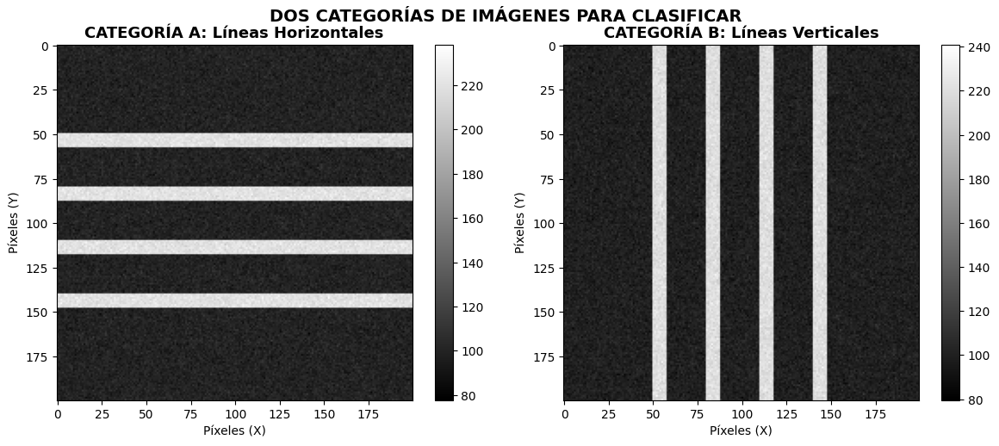

✓ Imágenes creadas:
  - Imagen A (Líneas Horizontales): (200, 200)
  - Imagen B (Líneas Verticales): (200, 200)


In [2]:
def crear_imagen_categoria_A(height=200, width=200, seed=42):
    """Crea una imagen que representa la CATEGORÍA A: Líneas Horizontales"""
    np.random.seed(seed)
    img = np.ones((height, width), dtype=np.float32) * 100
    
    # Agregar líneas horizontales claras
    for y in [50, 80, 110, 140]:
        img[y:y+8, :] = 220  # Líneas blancas
    
    # Agregar pequeño ruido gaussiano
    img += np.random.normal(0, 5, img.shape)
    
    return np.clip(img, 0, 255).astype(np.float32)

def crear_imagen_categoria_B(height=200, width=200, seed=43):
    """Crea una imagen que representa la CATEGORÍA B: Líneas Verticales"""
    np.random.seed(seed)
    img = np.ones((height, width), dtype=np.float32) * 100
    
    # Agregar líneas verticales claras
    for x in [50, 80, 110, 140]:
        img[:, x:x+8] = 220  # Líneas blancas
    
    # Agregar pequeño ruido gaussiano
    img += np.random.normal(0, 5, img.shape)
    
    return np.clip(img, 0, 255).astype(np.float32)

# Crear las imágenes
img_categoria_A = crear_imagen_categoria_A()
img_categoria_B = crear_imagen_categoria_B()

# Visualizar
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

im = axes[0].imshow(img_categoria_A, cmap='gray')
axes[0].set_title('CATEGORÍA A: Líneas Horizontales', fontweight='bold', fontsize=13)
axes[0].set_xlabel('Píxeles (X)')
axes[0].set_ylabel('Píxeles (Y)')
plt.colorbar(im, ax=axes[0])

im = axes[1].imshow(img_categoria_B, cmap='gray')
axes[1].set_title('CATEGORÍA B: Líneas Verticales', fontweight='bold', fontsize=13)
axes[1].set_xlabel('Píxeles (X)')
axes[1].set_ylabel('Píxeles (Y)')
plt.colorbar(im, ax=axes[1])

fig.suptitle('DOS CATEGORÍAS DE IMÁGENES PARA CLASIFICAR', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("✓ Imágenes creadas:")
print(f"  - Imagen A (Líneas Horizontales): {img_categoria_A.shape}")
print(f"  - Imagen B (Líneas Verticales): {img_categoria_B.shape}")

## Sección 2: Entender Kernels - Experimento Guiado

Vamos a entender cómo diferentes kernels responden a las características de nuestras imágenes.


📊 Aplicando convoluciones...



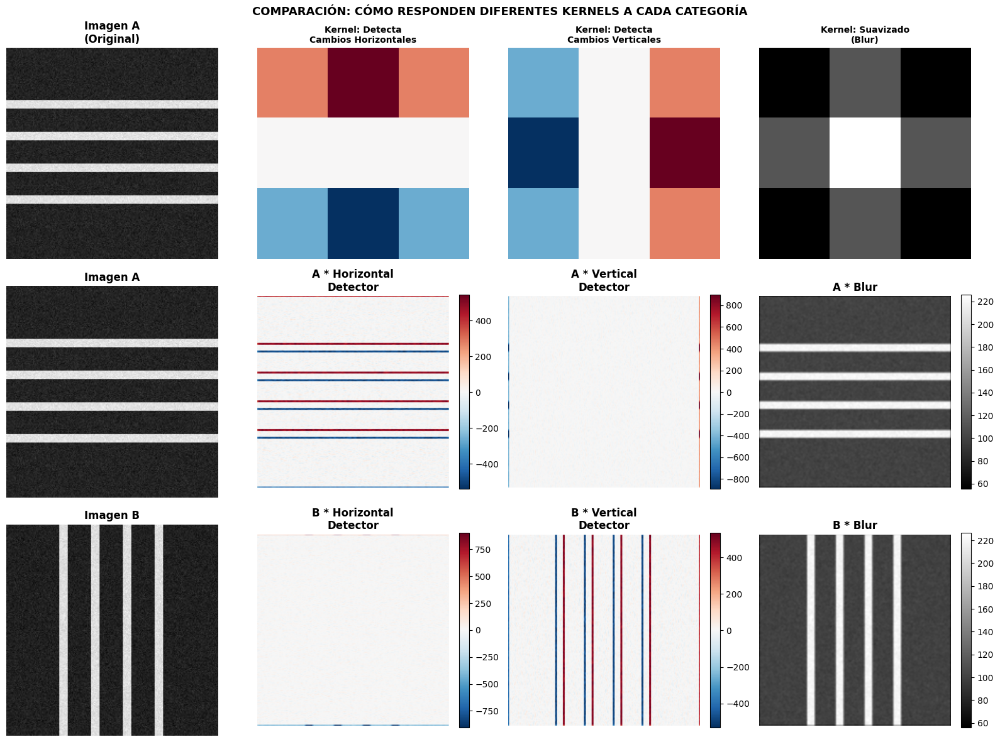


📈 ANÁLISIS DE RESPUESTAS:

Categoría A (Líneas Horizontales):
  - Detector Horizontal: Media=0.02, Max=546.36
  - Detector Vertical:   Media=0.00, Max=899.56
  - Suavizado:           Media=118.64, Max=226.11

Categoría B (Líneas Verticales):
  - Detector Horizontal: Media=-0.00, Max=903.87
  - Detector Vertical:   Media=0.02, Max=535.20
  - Suavizado:           Media=118.68, Max=226.62

✓ Observación: El detector de cambios horizontales responde MÁS a líneas horizontales
✓ Observación: El detector de cambios verticales responde MÁS a líneas verticales


In [3]:
# Definir algunos kernels básicos
kernel_detactor_horizontal = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
], dtype=np.float32)

kernel_detector_vertical = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)

kernel_suavizado = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
], dtype=np.float32) / 16

# Aplicar convoluciones
print("\n📊 Aplicando convoluciones...\n")

# Categoría A con diferentes filtros
A_horizontal = signal.convolve2d(img_categoria_A, kernel_detactor_horizontal, mode='same')
A_vertical = signal.convolve2d(img_categoria_A, kernel_detector_vertical, mode='same')
A_suavizado = signal.convolve2d(img_categoria_A, kernel_suavizado, mode='same')

# Categoría B con diferentes filtros
B_horizontal = signal.convolve2d(img_categoria_B, kernel_detactor_horizontal, mode='same')
B_vertical = signal.convolve2d(img_categoria_B, kernel_detector_vertical, mode='same')
B_suavizado = signal.convolve2d(img_categoria_B, kernel_suavizado, mode='same')

# Visualizar resultados
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

# Fila 1: Original
axes[0, 0].imshow(img_categoria_A, cmap='gray')
axes[0, 0].set_title('Imagen A\n(Original)', fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(kernel_detactor_horizontal, cmap='RdBu_r')
axes[0, 1].set_title('Kernel: Detecta\nCambios Horizontales', fontweight='bold', fontsize=10)
axes[0, 1].axis('off')

axes[0, 2].imshow(kernel_detector_vertical, cmap='RdBu_r')
axes[0, 2].set_title('Kernel: Detecta\nCambios Verticales', fontweight='bold', fontsize=10)
axes[0, 2].axis('off')

axes[0, 3].imshow(kernel_suavizado, cmap='gray')
axes[0, 3].set_title('Kernel: Suavizado\n(Blur)', fontweight='bold', fontsize=10)
axes[0, 3].axis('off')

# Fila 2: Resultados Categoría A
axes[1, 0].imshow(img_categoria_A, cmap='gray')
axes[1, 0].set_title('Imagen A', fontweight='bold')
axes[1, 0].axis('off')

im = axes[1, 1].imshow(A_horizontal, cmap='RdBu_r')
axes[1, 1].set_title('A * Horizontal\nDetector', fontweight='bold')
axes[1, 1].axis('off')
plt.colorbar(im, ax=axes[1, 1], fraction=0.046)

im = axes[1, 2].imshow(A_vertical, cmap='RdBu_r')
axes[1, 2].set_title('A * Vertical\nDetector', fontweight='bold')
axes[1, 2].axis('off')
plt.colorbar(im, ax=axes[1, 2], fraction=0.046)

im = axes[1, 3].imshow(A_suavizado, cmap='gray')
axes[1, 3].set_title('A * Blur', fontweight='bold')
axes[1, 3].axis('off')
plt.colorbar(im, ax=axes[1, 3], fraction=0.046)

# Fila 3: Resultados Categoría B
axes[2, 0].imshow(img_categoria_B, cmap='gray')
axes[2, 0].set_title('Imagen B', fontweight='bold')
axes[2, 0].axis('off')

im = axes[2, 1].imshow(B_horizontal, cmap='RdBu_r')
axes[2, 1].set_title('B * Horizontal\nDetector', fontweight='bold')
axes[2, 1].axis('off')
plt.colorbar(im, ax=axes[2, 1], fraction=0.046)

im = axes[2, 2].imshow(B_vertical, cmap='RdBu_r')
axes[2, 2].set_title('B * Vertical\nDetector', fontweight='bold')
axes[2, 2].axis('off')
plt.colorbar(im, ax=axes[2, 2], fraction=0.046)

im = axes[2, 3].imshow(B_suavizado, cmap='gray')
axes[2, 3].set_title('B * Blur', fontweight='bold')
axes[2, 3].axis('off')
plt.colorbar(im, ax=axes[2, 3], fraction=0.046)

fig.suptitle('COMPARACIÓN: CÓMO RESPONDEN DIFERENTES KERNELS A CADA CATEGORÍA',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# Estadísticas
print("\n📈 ANÁLISIS DE RESPUESTAS:")
print("\nCategoría A (Líneas Horizontales):")
print(f"  - Detector Horizontal: Media={A_horizontal.mean():.2f}, Max={A_horizontal.max():.2f}")
print(f"  - Detector Vertical:   Media={A_vertical.mean():.2f}, Max={A_vertical.max():.2f}")
print(f"  - Suavizado:           Media={A_suavizado.mean():.2f}, Max={A_suavizado.max():.2f}")

print("\nCategoría B (Líneas Verticales):")
print(f"  - Detector Horizontal: Media={B_horizontal.mean():.2f}, Max={B_horizontal.max():.2f}")
print(f"  - Detector Vertical:   Media={B_vertical.mean():.2f}, Max={B_vertical.max():.2f}")
print(f"  - Suavizado:           Media={B_suavizado.mean():.2f}, Max={B_suavizado.max():.2f}")

print("\n✓ Observación: El detector de cambios horizontales responde MÁS a líneas horizontales")
print("✓ Observación: El detector de cambios verticales responde MÁS a líneas verticales")

## Sección 3: 🎯 EJERCICIO 1 - Crear tu Propio Kernel

Ahora es tu turno de crear kernels que mejor distingan entre las dos categorías.

**Instrucciones:**
1. Define un kernel de 3×3 que creas que será útil
2. Pruébalo en ambas imágenes
3. Analiza qué características detecta
4. Ajusta los valores si es necesario

In [4]:
from pathlib import Path

base_dir = Path("/home/moon/Desktop/Vision/Computer_Vision/Datasets") 
car_dir = base_dir / "car"

for img_path in car_dir.iterdir():
    if img_path.suffix.lower() in [".jpg", ".jpeg", ".png"]:
        with Image.open(img_path) as img:
            print(img_path.name, img.size)  # (ancho, alto)

Car (1188).jpeg (224, 224)
Car (1547).jpeg (224, 224)
Car (1411).jpeg (224, 224)
Car (1871).jpeg (224, 224)
Car (667).jpeg (224, 224)
Car (1018).jpeg (224, 224)
Car (774).jpeg (224, 224)
Car (698).jpeg (224, 224)
Car (1781).jpeg (224, 224)
Car (1210).jpeg (224, 224)


In [5]:
bike_dir = base_dir / "bike"

for img_path in bike_dir.iterdir():
    if img_path.suffix.lower() in [".jpg", ".jpeg", ".png"]:
        with Image.open(img_path) as img:
            print(img_path.name, img.size)  # (ancho, alto)

Bike (1082).jpeg (224, 224)
Bike (1077).jpeg (224, 224)
Bike (1441).jpeg (224, 224)
Bike (1507).jpeg (224, 224)
Bike (1458).jpeg (224, 224)
Bike (84).jpg (224, 224)
Bike (871).jpeg (224, 224)
Bike (129).jpg (224, 224)
Bike (1409).jpeg (224, 224)
Bike (549).jpeg (224, 224)


In [6]:
base_dir = Path("/home/moon/Desktop/Vision/Computer_Vision/Datasets") 
TARGET_SIZE = (224, 224)
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def resize_in_place(class_name: str):
    cls_dir = base_dir / class_name
    count = 0

    for p in cls_dir.iterdir():
        if not p.is_file() or p.suffix.lower() not in IMG_EXTS:
            continue
        try:
            with Image.open(p) as img:
                img = img.convert("RGB")
                img = img.resize(TARGET_SIZE, Image.Resampling.LANCZOS)

            img.save(p, quality=95)
            count += 1
        except Exception as e:
            print(f"⚠️ Error con {p.name}: {e}")

    print(f"✅ {class_name}: {count} imágenes redimensionadas y sobrescritas a {TARGET_SIZE}")

resize_in_place("car")
resize_in_place("bike")


✅ car: 10 imágenes redimensionadas y sobrescritas a (224, 224)
✅ bike: 10 imágenes redimensionadas y sobrescritas a (224, 224)


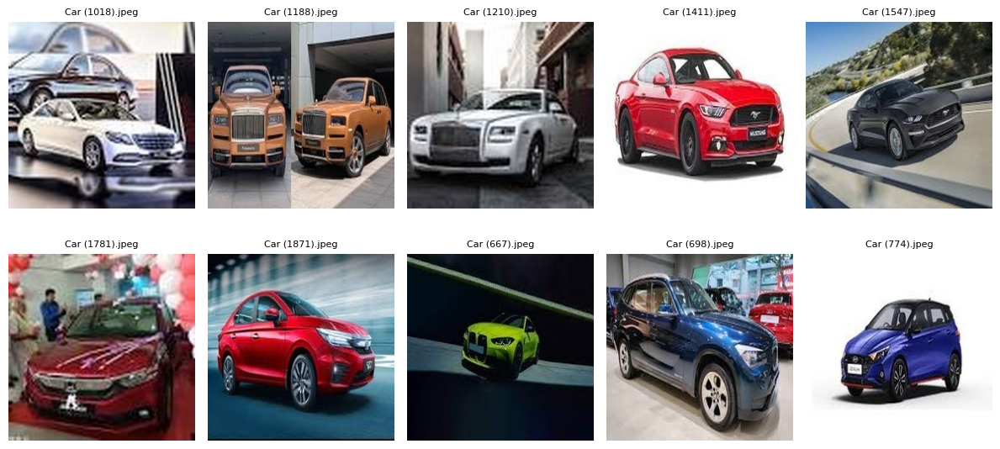

In [7]:
car_dir = base_dir / "car"
imgs = sorted([p for p in car_dir.iterdir() if p.suffix.lower() in [".jpg", ".jpeg", ".png"]])[:10]

plt.figure(figsize=(12, 6))
for i, p in enumerate(imgs):
    img = Image.open(p)
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(p.name, fontsize=8)
    plt.axis("off")
plt.tight_layout()
plt.show()

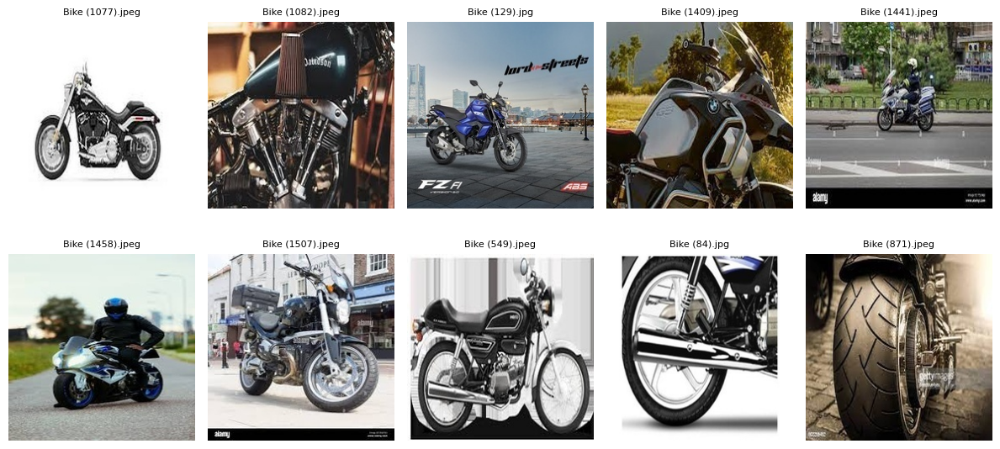

In [8]:
bike_dir = base_dir / "bike"
imgs = sorted([p for p in bike_dir.iterdir() if p.suffix.lower() in [".jpg", ".jpeg", ".png"]])[:10]

plt.figure(figsize=(12, 6))
for i, p in enumerate(imgs):
    img = Image.open(p)
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(p.name, fontsize=8)
    plt.axis("off")
plt.tight_layout()
plt.show()

In [9]:
from PIL import ImageFilter

K = np.array([
    [ 0, -1,  0],
    [-1,  5, -1],
    [ 0, -1,  0]
], dtype=np.float32)

print("Kernel:\n", K)
print("Suma del kernel:", K.sum())

sharpen_kernel = ImageFilter.Kernel(
    size=(3, 3),
    kernel=K.flatten().tolist(),  
    scale=None,                   
    offset=0
)

Kernel:
 [[ 0. -1.  0.]
 [-1.  5. -1.]
 [ 0. -1.  0.]]
Suma del kernel: 1.0


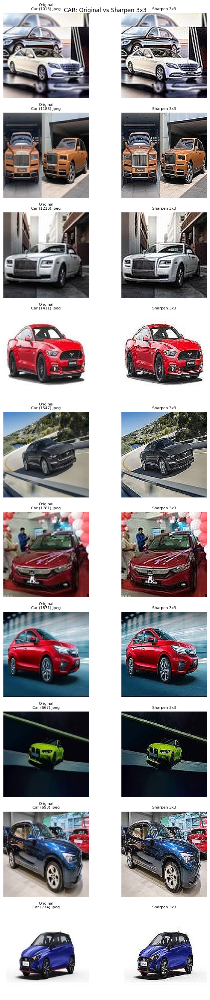

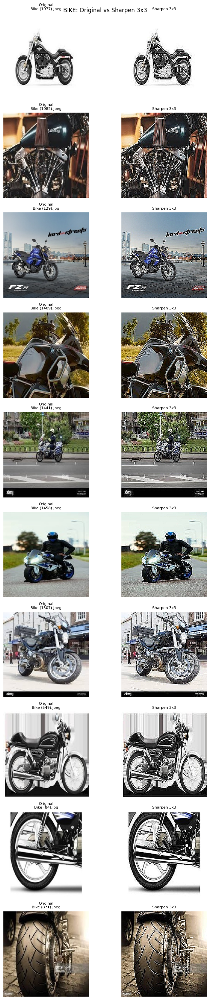

In [13]:
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def get_images(folder: Path, n=5):
    paths = sorted([p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS])
    return paths[:n]


def show_before_after_vertical(paths, title):
    n = len(paths)
    plt.figure(figsize=(8, 3*n))  # más alto que ancho

    for i, p in enumerate(paths):
        img = Image.open(p).convert("RGB")
        filt = img.filter(sharpen_kernel)

        # Columna 1: original
        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(img)
        plt.title(f"Original\n{p.name}", fontsize=8)
        plt.axis("off")

        # Columna 2: filtrada
        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(filt)
        plt.title("Sharpen 3x3", fontsize=8)
        plt.axis("off")

    plt.suptitle(title, fontsize=12)
    plt.tight_layout()
    plt.show()

car_paths  = get_images(car_dir, 10)
bike_paths = get_images(bike_dir, 10)

show_before_after_vertical(car_paths,  "CAR: Original vs Sharpen 3x3")
show_before_after_vertical(bike_paths, "BIKE: Original vs Sharpen 3x3")




## Sección 4: 🎯 EJERCICIO 2 - Crear un Segundo Kernel

Crea un segundo kernel complementario que capture otras características.

In [ ]:
# 📝 CREA TU SEGUNDO KERNEL AQUÍ
mi_kernel_2 = np.array([
    [0, 0, 0],  # ← Cambia estos valores
    [0, 0, 0],  # ← Cambia estos valores
    [0, 0, 0]   # ← Cambia estos valores
], dtype=np.float32)

print("\n📌 Tu Kernel 2:")
print(mi_kernel_2)

# Aplicar tu kernel
resultado_A_kernel2 = signal.convolve2d(img_categoria_A, mi_kernel_2, mode='same')
resultado_B_kernel2 = signal.convolve2d(img_categoria_B, mi_kernel_2, mode='same')

# Visualizar
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

im = axes[0].imshow(img_categoria_B, cmap='gray')
axes[0].set_title('Imagen B\n(Original)', fontweight='bold')
axes[0].axis('off')

im = axes[1].imshow(mi_kernel_2, cmap='RdBu_r')
axes[1].set_title('Tu Kernel 2', fontweight='bold')
axes[1].axis('off')
for i in range(mi_kernel_2.shape[0]):
    for j in range(mi_kernel_2.shape[1]):
        axes[1].text(j, i, f'{mi_kernel_2[i,j]:.0f}', ha='center', va='center', 
                    fontsize=11, fontweight='bold', color='white')

im = axes[2].imshow(resultado_A_kernel2, cmap='RdBu_r')
axes[2].set_title('Resultado en A\n(Líneas Horiz.)', fontweight='bold')
axes[2].axis('off')
plt.colorbar(im, ax=axes[2])

im = axes[3].imshow(resultado_B_kernel2, cmap='RdBu_r')
axes[3].set_title('Resultado en B\n(Líneas Vert.)', fontweight='bold')
axes[3].axis('off')
plt.colorbar(im, ax=axes[3])

plt.tight_layout()
plt.show()

# Análisis
print("\n📊 ANÁLISIS DE TU KERNEL 2:")
print(f"Respuesta en Imagen A: Media={resultado_A_kernel2.mean():.2f}, Max={resultado_A_kernel2.max():.2f}, Min={resultado_A_kernel2.min():.2f}")
print(f"Respuesta en Imagen B: Media={resultado_B_kernel2.mean():.2f}, Max={resultado_B_kernel2.max():.2f}, Min={resultado_B_kernel2.min():.2f}")

In [14]:
Kx = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)

Ky = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)

print("Kx:\n", Kx)
print("Ky:\n", Ky)

Kx:
 [[-1.  0.  1.]
 [-2.  0.  2.]
 [-1.  0.  1.]]
Ky:
 [[-1. -2. -1.]
 [ 0.  0.  0.]
 [ 1.  2.  1.]]


In [15]:
def conv3x3(gray: np.ndarray, K: np.ndarray) -> np.ndarray:
    """Convolución 3x3 simple (padding tipo 'edge'). gray: (H,W) float32"""
    pad = np.pad(gray, ((1,1),(1,1)), mode="edge")
    out = (
        K[0,0]*pad[:-2, :-2] + K[0,1]*pad[:-2, 1:-1] + K[0,2]*pad[:-2, 2:] +
        K[1,0]*pad[1:-1, :-2] + K[1,1]*pad[1:-1, 1:-1] + K[1,2]*pad[1:-1, 2:] +
        K[2,0]*pad[2:, :-2] + K[2,1]*pad[2:, 1:-1] + K[2,2]*pad[2:, 2:]
    )
    return out

def sobel_edges(pil_img: Image.Image) -> Image.Image:
    # 1) a escala de grises
    gray = np.array(pil_img.convert("L"), dtype=np.float32)

    # 2) gradientes
    gx = conv3x3(gray, Kx)
    gy = conv3x3(gray, Ky)

    # 3) magnitud de borde
    mag = np.sqrt(gx**2 + gy**2)

    # 4) normalizar a 0-255 para visualizar
    mag = mag / (mag.max() + 1e-8) * 255.0
    mag = mag.astype(np.uint8)

    return Image.fromarray(mag, mode="L")


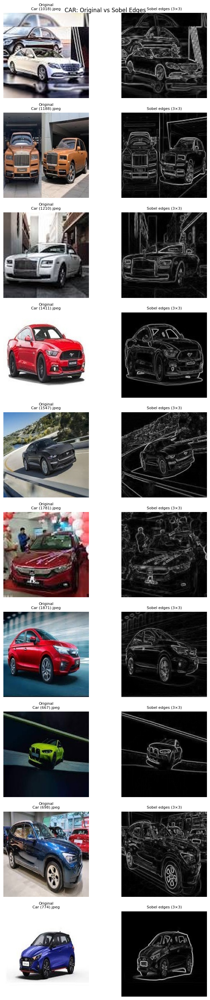

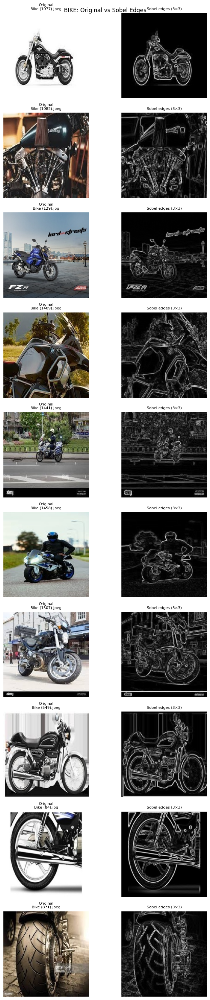

In [16]:
def show_before_after_vertical_sobel(paths, title):
    n = len(paths)
    plt.figure(figsize=(8, 3*n))

    for i, p in enumerate(paths):
        img = Image.open(p).convert("RGB")
        edges = sobel_edges(img)

        # Original
        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(img)
        plt.title(f"Original\n{p.name}", fontsize=8)
        plt.axis("off")

        # Sobel edges
        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(edges, cmap="gray")
        plt.title("Sobel edges (3×3)", fontsize=8)
        plt.axis("off")

    plt.suptitle(title, fontsize=12)
    plt.tight_layout()
    plt.show()

show_before_after_vertical_sobel(car_paths,  "CAR: Original vs Sobel Edges")
show_before_after_vertical_sobel(bike_paths, "BIKE: Original vs Sobel Edges")


## Sección 5: 🎯 EJERCICIO 3 - Crear un Clasificador Simple

Combina tus dos kernels para crear un clasificador básico que distinga entre las dos categorías.

In [ ]:
def clasificar_imagen(imagen, kernel1, kernel2):
    """
    Clasifica una imagen como Categoría A o B usando dos kernels.
    
    Retorna:
    - score_A: Puntuación para categoría A
    - score_B: Puntuación para categoría B
    - clase: 'A' si score_A > score_B, 'B' en caso contrario
    """
    
    # Aplicar convoluciones
    resultado1 = signal.convolve2d(imagen, kernel1, mode='same')
    resultado2 = signal.convolve2d(imagen, kernel2, mode='same')
    
    # Calcular "energía" (suma de valores absolutos cuadrados)
    score_1 = np.sum(resultado1 ** 2)
    score_2 = np.sum(resultado2 ** 2)
    
    # Determinar clase
    # 📝 MODIFICA ESTA LÓGICA SI LO NECESITAS:
    if score_1 > score_2:
        clase = 'A'
    else:
        clase = 'B'
    
    return score_1, score_2, clase

# Probar el clasificador
print("\n🤖 PROBANDO EL CLASIFICADOR:")
print("\n" + "="*60)

# Clasificar imagen de categoría A
score_A1, score_A2, clase_A = clasificar_imagen(img_categoria_A, mi_kernel_1, mi_kernel_2)
print(f"\nImagen A (Líneas Horizontales):")
print(f"  Score Kernel 1: {score_A1:.2f}")
print(f"  Score Kernel 2: {score_A2:.2f}")
print(f"  ➜ Clasificada como: {clase_A}")
print(f"  ✓ CORRECTO" if clase_A == 'A' else f"  ✗ INCORRECTO")

# Clasificar imagen de categoría B
score_B1, score_B2, clase_B = clasificar_imagen(img_categoria_B, mi_kernel_1, mi_kernel_2)
print(f"\nImagen B (Líneas Verticales):")
print(f"  Score Kernel 1: {score_B1:.2f}")
print(f"  Score Kernel 2: {score_B2:.2f}")
print(f"  ➜ Clasificada como: {clase_B}")
print(f"  ✓ CORRECTO" if clase_B == 'B' else f"  ✗ INCORRECTO")

print("\n" + "="*60)

# Calcular precisión
aciertos = (clase_A == 'A') + (clase_B == 'B')
accuracy = aciertos / 2 * 100
print(f"\n📊 PRECISIÓN DEL CLASIFICADOR: {accuracy:.0f}%")

if accuracy == 100:
    print("🎉 ¡Perfecto! ¡Tu clasificador funciona correctamente!")
elif accuracy == 50:
    print("⚠️  Necesitas mejorar los kernels. No está mejor que un clasificador aleatorio.")
else:
    print("✓ Buen progreso. Puedes intentar mejorar los kernels.")

In [17]:
base_dir = Path("/home/moon/Desktop/Vision/Computer_Vision/Datasets")
car_dir  = base_dir / "car"
bike_dir = base_dir / "bike"

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

In [18]:
# Sharpen 3x3
K_sharp = np.array([
    [ 0, -1,  0],
    [-1,  5, -1],
    [ 0, -1,  0]
], dtype=np.float32)

# Sobel (X, Y)
Kx = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)

Ky = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)


In [19]:
def conv3x3(gray: np.ndarray, K: np.ndarray) -> np.ndarray:
    pad = np.pad(gray, ((1,1),(1,1)), mode="edge")
    out = (
        K[0,0]*pad[:-2, :-2] + K[0,1]*pad[:-2, 1:-1] + K[0,2]*pad[:-2, 2:] +
        K[1,0]*pad[1:-1, :-2] + K[1,1]*pad[1:-1, 1:-1] + K[1,2]*pad[1:-1, 2:] +
        K[2,0]*pad[2:, :-2] + K[2,1]*pad[2:, 1:-1] + K[2,2]*pad[2:, 2:]
    )
    return out

def extract_features(img: Image.Image, edge_thr=0.25) -> np.ndarray:
    gray = np.array(img.convert("L"), dtype=np.float32)  # 0..255

    # --- Sharpen stats ---
    sharp = conv3x3(gray, K_sharp)
    sharp = np.clip(sharp, 0, 255)
    diff = (sharp - gray) / 255.0
    sharp_mean = float(np.mean(np.abs(diff)))
    sharp_std  = float(np.std(diff))

    # --- Sobel stats ---
    gx = conv3x3(gray, Kx)
    gy = conv3x3(gray, Ky)
    mag = np.sqrt(gx**2 + gy**2)
    mag_norm = mag / (mag.max() + 1e-8)  # 0..1

    edge_mean = float(mag_norm.mean())
    edge_std  = float(mag_norm.std())
    edge_density = float((mag_norm > edge_thr).mean())

    # Ratio de orientación (extrae "patrones" distintos)
    gx_m = float(np.mean(np.abs(gx)))
    gy_m = float(np.mean(np.abs(gy)))
    orient_ratio = gx_m / (gy_m + 1e-8)

    return np.array([sharp_mean, sharp_std, edge_mean, edge_std, edge_density, orient_ratio], dtype=np.float32)


In [20]:
def list_images(folder: Path):
    return sorted([p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS])

car_paths  = list_images(car_dir)
bike_paths = list_images(bike_dir)

X_list, y_list, paths_list = [], [], []

for p in car_paths:
    img = Image.open(p).convert("RGB")
    X_list.append(extract_features(img))
    y_list.append(0)  # 0 = car
    paths_list.append(p)

for p in bike_paths:
    img = Image.open(p).convert("RGB")
    X_list.append(extract_features(img))
    y_list.append(1)  # 1 = bike
    paths_list.append(p)

X = np.vstack(X_list)
y = np.array(y_list, dtype=np.int32)

print("X shape:", X.shape, "y shape:", y.shape)


X shape: (20, 6) y shape: (20,)


In [ ]:
mu = X.mean(axis=0)
sigma = X.std(axis=0) + 1e-8
Xn = (X - mu) / sigma

In [ ]:
def knn_predict_numpy(X_train, y_train, x, k=3):
    # distancias euclidianas
    d = np.sqrt(np.sum((X_train - x)**2, axis=1))
    idx = np.argsort(d)[:k]
    votes = y_train[idx]
    # votación mayoritaria
    return int(np.round(votes.mean()))  # como son 0/1

# Intentar sklearn
use_sklearn = True
try:
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.model_selection import LeaveOneOut
except Exception:
    use_sklearn = False

k = 3


In [25]:
import numpy as np
from PIL import Image

# ---- kernels (los mismos) ----
K_sharp = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]], dtype=np.float32)

Kx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=np.float32)
Ky = np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype=np.float32)

def conv3x3(gray: np.ndarray, K: np.ndarray) -> np.ndarray:
    pad = np.pad(gray, ((1,1),(1,1)), mode="edge")
    return (
        K[0,0]*pad[:-2,:-2] + K[0,1]*pad[:-2,1:-1] + K[0,2]*pad[:-2,2:] +
        K[1,0]*pad[1:-1,:-2] + K[1,1]*pad[1:-1,1:-1] + K[1,2]*pad[1:-1,2:] +
        K[2,0]*pad[2:,:-2] + K[2,1]*pad[2:,1:-1] + K[2,2]*pad[2:,2:]
    )

def extract_features_v2(img: Image.Image) -> np.ndarray:
    gray = np.array(img.convert("L"), dtype=np.float32) / 255.0  # 0..1

    # --- Sharpen: “detalle añadido” ---
    sharp = conv3x3(gray, K_sharp)
    sharp = np.clip(sharp, 0, 1)
    diff = sharp - gray
    sharp_mean = float(np.mean(np.abs(diff)))
    sharp_std  = float(np.std(diff))

    # --- Sobel: bordes ---
    gx = conv3x3(gray, Kx)
    gy = conv3x3(gray, Ky)
    mag = np.sqrt(gx**2 + gy**2)
    mag_norm = mag / (mag.max() + 1e-8)  # 0..1

    edge_mean = float(mag_norm.mean())
    edge_std  = float(mag_norm.std())

    # densidad de bordes con varios umbrales (más robusto)
    d15 = float((mag_norm > 0.15).mean())
    d25 = float((mag_norm > 0.25).mean())
    d35 = float((mag_norm > 0.35).mean())

    # orientación: relación de energía gx/gy
    gx_m = float(np.mean(np.abs(gx)))
    gy_m = float(np.mean(np.abs(gy)))
    orient_ratio = gx_m / (gy_m + 1e-8)

    # distribución espacial (2x2): motos suelen tener bordes finos más repartidos
    H, W = mag_norm.shape
    q1 = float(mag_norm[:H//2, :W//2].mean())
    q2 = float(mag_norm[:H//2, W//2:].mean())
    q3 = float(mag_norm[H//2:, :W//2].mean())
    q4 = float(mag_norm[H//2:, W//2:].mean())

    return np.array([
        sharp_mean, sharp_std,
        edge_mean, edge_std,
        d15, d25, d35,
        orient_ratio,
        q1, q2, q3, q4
    ], dtype=np.float32)


In [26]:
from pathlib import Path

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def list_images(folder: Path):
    return sorted([p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS])

car_paths  = list_images(car_dir)
bike_paths = list_images(bike_dir)

X_list, y_list, P_list = [], [], []

for p in car_paths:
    img = Image.open(p).convert("RGB")
    X_list.append(extract_features_v2(img))
    y_list.append(0)   # car
    P_list.append(p)

for p in bike_paths:
    img = Image.open(p).convert("RGB")
    X_list.append(extract_features_v2(img))
    y_list.append(1)   # bike
    P_list.append(p)

X = np.vstack(X_list)
y = np.array(y_list, dtype=np.int32)

# normalización (clave para KNN)
mu = X.mean(axis=0)
sigma = X.std(axis=0) + 1e-8
Xn = (X - mu) / sigma

print("Xn:", Xn.shape)


Xn: (20, 12)


In [27]:
def distance(a, b, metric="euclidean"):
    if metric == "euclidean":
        return np.sqrt(np.sum((a-b)**2))
    if metric == "manhattan":
        return np.sum(np.abs(a-b))
    if metric == "cosine":
        denom = (np.linalg.norm(a)*np.linalg.norm(b) + 1e-8)
        return 1.0 - float(np.dot(a,b)/denom)
    raise ValueError("metric inválida")

def knn_predict(Xtr, ytr, x, k=3, metric="euclidean", weights="uniform"):
    d = np.array([distance(v, x, metric) for v in Xtr], dtype=np.float32)
    idx = np.argsort(d)[:k]
    votes = ytr[idx]

    if weights == "uniform":
        return int(np.round(votes.mean()))
    else:
        w = 1.0 / (d[idx] + 1e-8)  # distance weighting
        score = (w * votes).sum() / w.sum()
        return int(score >= 0.5)

def loo_acc(Xn, y, k=3, metric="euclidean", weights="uniform"):
    preds = []
    for i in range(len(Xn)):
        mask = np.ones(len(Xn), dtype=bool)
        mask[i] = False
        pred = knn_predict(Xn[mask], y[mask], Xn[i], k=k, metric=metric, weights=weights)
        preds.append(pred)
    preds = np.array(preds, dtype=np.int32)
    return float((preds == y).mean()), preds

# grid search
Ks = [1,3,5,7,9]
metrics = ["euclidean", "manhattan", "cosine"]
weights_opts = ["uniform", "distance"]

best = (-1, None, None, None, None)
for k in Ks:
    for m in metrics:
        for w in weights_opts:
            acc, preds = loo_acc(Xn, y, k=k, metric=m, weights=w)
            if acc > best[0]:
                best = (acc, k, m, w, preds)

best_acc, best_k, best_metric, best_w, best_preds = best
print("BEST -> acc:", best_acc, "k:", best_k, "metric:", best_metric, "weights:", best_w)


BEST -> acc: 0.7 k: 3 metric: cosine weights: uniform


In [28]:
label = {0:"car", 1:"bike"}

wrong = []
for i, (t, p) in enumerate(zip(y, best_preds)):
    if t != p:
        wrong.append((P_list[i].name, label[t], label[p]))

print("Misclasificados:", len(wrong))
for w in wrong:
    print(w)

Misclasificados: 6
('Car (1018).jpeg', 'car', 'bike')
('Car (1188).jpeg', 'car', 'bike')
('Car (698).jpeg', 'car', 'bike')
('Bike (129).jpg', 'bike', 'car')
('Bike (1441).jpeg', 'bike', 'car')
('Bike (1458).jpeg', 'bike', 'car')


## Sección 6: 📊 Visualizar el Espacio de Características

Veamos cómo tus kernels transforman las imágenes en un "espacio de características".

## 📝 SECCIÓN 7: INFORME FINAL

Completa este informe explicando tu trabajo:

### Responde las siguientes preguntas:

**1. ¿Qué valores pusiste en tu Kernel 1 y por qué?**

```
Mi Kernel 1:
[  0, -1,  0 ]
[ -1,  5, -1 ]
[  0, -1,  0 ]

Razón:
Elegí un kernel “sharpen” suave para realzar bordes y detalles sin cambiar demasiado el brillo general.
El 5 en el centro mantiene la información principal del píxel y los -1 alrededor restan un poco a los vecinos,
aumentando el contraste local (contornos más definidos) con una suma total ≈ 1.
```

---

**2. ¿Qué valores pusiste en tu Kernel 2 y por qué?**

```
Mi Kernel 2 (Sobel X):
[ -1,  0,  1 ]
[ -2,  0,  2 ]
[ -1,  0,  1 ]

Mi Kernel 2 (Sobel Y):
[ -1, -2, -1 ]
[  0,  0,  0 ]
[  1,  2,  1 ]

Razón:
Sobel detecta cambios fuertes de intensidad (bordes). Kx resalta bordes verticales y Ky resalta bordes horizontales.
Luego combino ambos para obtener la magnitud del gradiente y medir cuántos bordes/contornos tiene la imagen.

```

---

**3. ¿Cómo funciona tu clasificador?**

```
Extraigo características de cada imagen aplicando los dos kernels: con Kernel 1 mido el “detalle añadido”
(diferencia entre imagen original y sharpen) y con Kernel 2 mido fuerza/densidad de bordes (Sobel).
Con esas características construyo un vector por imagen y uso KNN: la clase se decide por votación de los k vecinos
más cercanos en el espacio de características (sin entrenamiento de pesos).
```

---

**4. ¿Qué patrones detecta cada kernel?**

```
Kernel 1 detecta:
Detalles finos y contornos más nítidos (aumenta contraste local). Hace que bordes de carrocería,
luces, ruedas, etc. se vean más definidos.

Kernel 2 detecta:
Bordes/contornos (cambios bruscos de intensidad) y orientación de esos bordes (horizontal/vertical).
Sirve para capturar la cantidad de “estructura” y líneas en la imagen (formas y textura).


---

**5. Si tu clasificador no fue 100% acertado, ¿qué cambiarías?**

```
Mejoraría las características y la forma de comparar imágenes:
- Ajustar k y la métrica (euclidiana/manhattan/coseno) y usar pesos por distancia en KNN.
- Incluir features más robustas: densidad de bordes con varios umbrales, distribución espacial (2×2),
  o un histograma de orientaciones (tipo HOG) basado en Sobel.
- Reducir ruido/fondo: aplicar un suavizado leve antes de Sobel o recortar/centrar el objeto si es posible.

```

---

**6. Conexión con CNNs: ¿Cómo se relaciona esto con redes neuronales convolucionales?**

```
Este ejercicio es una versión manual de una capa convolucional: un kernel 3×3 se “desliza” por la imagen y genera
un mapa de activación (bordes, detalles, texturas). En una CNN, en vez de elegir el kernel a mano (sharpen/Sobel),
la red aprende muchos kernels automáticamente durante el entrenamiento para extraer características cada vez más complejas.

```

---

### Lo que aprendiste:

1. ✅ **Un filtro (kernel) es una pequeña matriz** que detecta patrones específicos
2. ✅ **Diferentes kernels detectan diferentes características** (bordes horizontales, verticales, etc.)
3. ✅ **La convolución es el producto punto** entre el kernel y la región de la imagen
4. ✅ **Múltiples kernels pueden combinarse** para crear un clasificador
5. ✅ **En CNNs, el sistema APRENDE automáticamente** qué kernels son útiles

### Próxima clase:
Ahora que entiendes filtros, veremos cómo **redes neuronales convolucionales** usan capas de convolución para extraer características automáticamente y resolver problemas complejos de visión por computadora.

---

**Entrega:**
- [ ] Este notebook completado con todas las secciones
- [ ] Informe final rellenado
- [ ] Los kernels que creaste y explicación de su funcionamiento
- [ ] Curso en DataCAmp